# Stability regularisation: the converged runs

Eight training arms of the continuous-time physics-informed network on van der Pol (μ = 1, start (2, 0)), three horizons (T = 14, 27, 40 = 2.1, 4.1, 6.0 periods), ten seeds each, **every run trained to a demonstrated plateau and polished to a stall** before its outcome is read. Every term of the objective was logged through training.

| arm | what it is |
|---|---|
| plain | the unweighted objective, fixed Latin-hypercube collocation set |
| resample | plain, collocation points redrawn every epoch |
| reg | plain + the stability regulariser of Babic, Rohrhofer & Geiger (arXiv:2509.11768), on for the first 30k epochs |
| reg always | the regulariser never switched off (coefficient 0.5 throughout, kept in the polish) |
| reg+resample | regulariser + resampling: **the published protocol** of arXiv:2509.11768 |
| pseudo-time | pseudo-time stepping of Wang, Koohy, Lu & Perdikaris (arXiv:2604.23528), adaptive step per their reference code, resampling every epoch |
| causal | causally weighted residuals (Wang, Sankaran & Perdikaris), Adam front propagation |
| causal+reg | causal + the regulariser |

Protocol (all arms): 4×50 tanh, density 20 points per unit time, Adam lr 1e-3 to a plateau (objective improved < 1e-4 over the trailing 10k epochs, tested only after 60k epochs and after the regulariser is off; cap 200k), then the L-BFGS polish on the plain loss (stall rule, cap 60 restarts). Success = relative L2 vs the verified order-6 reference < 0.15. The failure classifier (from the saved autodiff residual on the reference grid): *parked* (> 30% of the window within |y| < 0.2), *flow-following* (|r| < 0.05 on ≥ 60% of the window with max |r| > 1: narrow defect bands between stretches that satisfy the equation, the splice signature), *diffuse* (the rest).

**Provenance.** Harness `stability_converged.py` (commit `1a4d4ff`, arms 7–8 added at `70de5fe`); runs on the Nikhef HTCondor farm: cluster 5764627 (first wave, loose plateau) → 5764822 (extension to the strict rule, 180 runs) → 5764884 (arms 7–8, 60 runs); results in `results/converged/` (`e8989bc`, `70de5fe`); Phase 1 fixed-budget results (cluster 5715089) in `results/runs/`; first-wave snapshot in `results/converged_wave1/` (untracked). Tables and figures below are produced by `analysis_converged.py` (about 7 minutes); this notebook loads its outputs. Theory: `theory.md`.

In [1]:
import pandas as pd, numpy as np
from IPython.display import Image, display
pd.set_option("display.width", 200); pd.set_option("display.max_columns", 40)
runs = pd.read_csv("results/converged_runs.csv")
summary = pd.read_csv("results/converged_summary.csv")
before_after = pd.read_csv("results/before_after.csv")
ARMS = ["base_unw", "resample_unw", "reg_unw", "reg_always_unw", "reg_resample_unw", "pseudo_unw", "base_causal", "reg_causal"]
SHORT = {"base_unw": "plain", "resample_unw": "resample", "reg_unw": "reg", "reg_always_unw": "reg always",
         "reg_resample_unw": "reg+resample", "pseudo_unw": "pseudo-time", "base_causal": "causal", "reg_causal": "causal+reg"}
for d in (runs, summary, before_after):
    d["arm"] = pd.Categorical(d["arm"], categories=ARMS, ordered=True)
print(len(runs), "runs;", int(runs.converged.sum()), "satisfy the strict convergence rule")

240 runs; 235 satisfy the strict convergence rule


## 1. Convergence verdicts

Every run exited Adam by plateau after at least 60k epochs; the polish stalled under its cap in all but one run (reg always, T = 27, seed at the 60-restart cap). Final losses and gradient norms are medians over the ten seeds.

In [2]:
cols = ["arm", "horizon", "n", "converged", "adam_epochs_median", "lbfgs_restarts_median", "lbfgs_stalled", "loss_median", "grad_norm_median"]
summary[cols].sort_values(["horizon", "arm"]).style.format({"loss_median": "{:.2e}", "grad_norm_median": "{:.2e}"}).hide(axis="index")

arm,horizon,n,converged,adam_epochs_median,lbfgs_restarts_median,lbfgs_stalled,loss_median,grad_norm_median
base_unw,14.000000,10.000000,10.000000,60125.000000,7.500000,10.000000,4.07e-07,1.62e-05
resample_unw,14.000000,10.000000,10.000000,60375.000000,7.000000,10.000000,3.76e-07,1.56e-05
reg_unw,14.000000,10.000000,10.000000,60000.000000,7.000000,10.000000,3.59e-07,1.19e-05
reg_always_unw,14.000000,10.000000,10.000000,60375.000000,7.000000,10.000000,3.56e-07,1.19e-05
reg_resample_unw,14.000000,10.000000,10.000000,60500.000000,6.000000,10.000000,4.14e-07,1.91e-05
pseudo_unw,14.000000,10.000000,10.000000,60000.000000,9.500000,10.000000,3.43e-07,1.71e-05
base_causal,14.000000,10.000000,10.000000,61125.000000,8.000000,10.000000,4.48e-07,2.31e-05
reg_causal,14.000000,10.000000,10.000000,60875.000000,10.500000,10.000000,4.29e-07,1.65e-05
base_unw,27.000000,10.000000,10.000000,62000.000000,5.000000,10.000000,3.24e-05,1.96e-03
resample_unw,27.000000,10.000000,10.000000,60500.000000,3.000000,10.000000,3.12e-02,8.36e-04


## 2. The headline: success and error per arm and horizon

Success rate at the source papers' threshold, and the median relative L2. Only pseudo-time stepping succeeds beyond two periods.

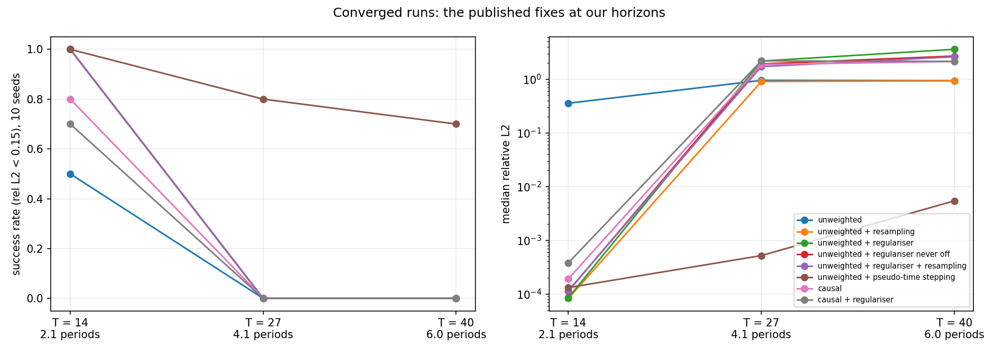

In [3]:
pv = summary.pivot(index="arm", columns="horizon", values=["success", "rel_l2_median"])
pv.index = [SHORT[a] for a in pv.index]
display(pv.style.format({("rel_l2_median", 14.0): "{:.1e}", ("rel_l2_median", 27.0): "{:.1e}", ("rel_l2_median", 40.0): "{:.1e}"}))
display(Image("figures/c07_summary.png", width=1100))

## 3. Convergence of every loss term

Rows are arms; columns are the objective (solid) with the plain loss (dashed), the initial-condition term, the residual term, the arm-specific term (raw regulariser value for the regularised arms, causally weighted residual for the causal arms, the relaxed residual and τ for pseudo-time), and the relative L2 against the reference. Adam epochs run first, the polish restarts are appended after the median Adam exit (dotted line). Gold band: regulariser active. Colour = outcome.

What to look for: (i) the parked branches (red) reach losses as low as the successes; (ii) in the regularised arms the relative L2 sits near 2 from the first epochs, and the raw regulariser value *rises* after the switch-off while the loss keeps falling; (iii) the pseudo-time arm's objective is noisy, because both the points and the relaxation target move every epoch, while its relative L2 descends monotonically; (iv) the polish drives the loss of the flow-following branches to 1e-4 and below without touching the error.

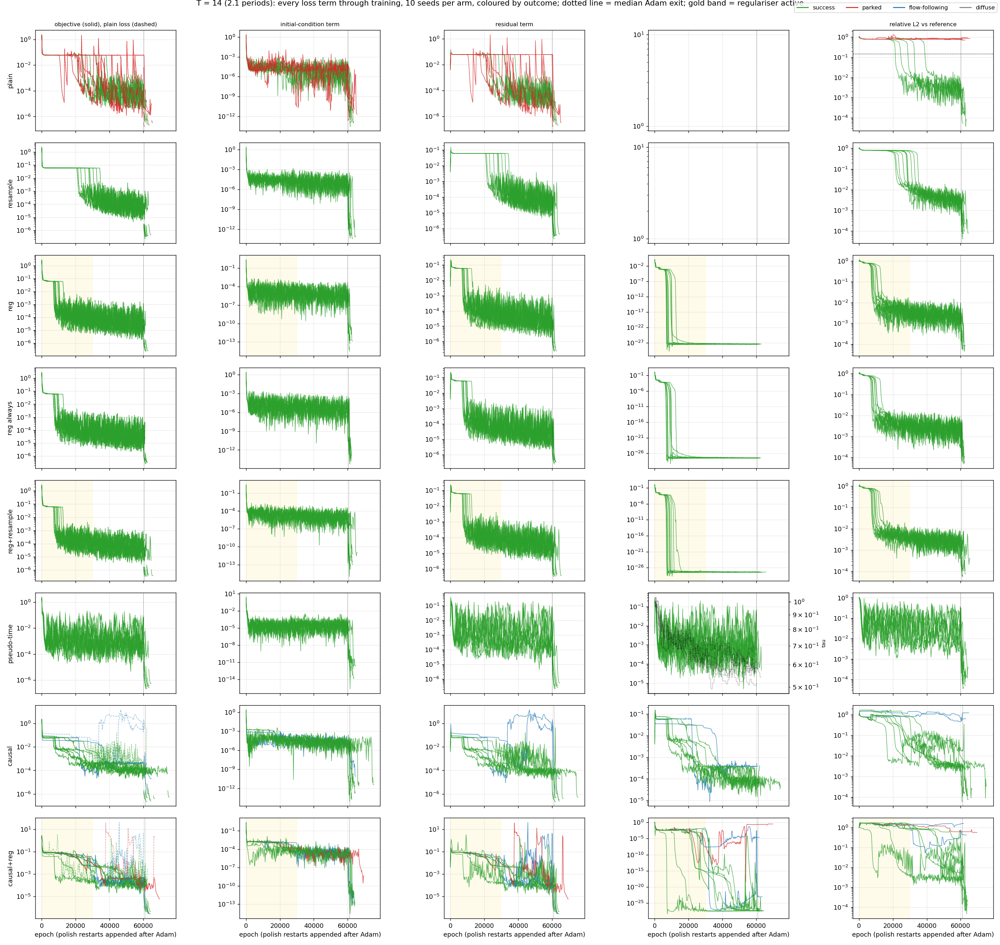

In [4]:
display(Image("figures/c01_convergence_T14.png", width=1400))

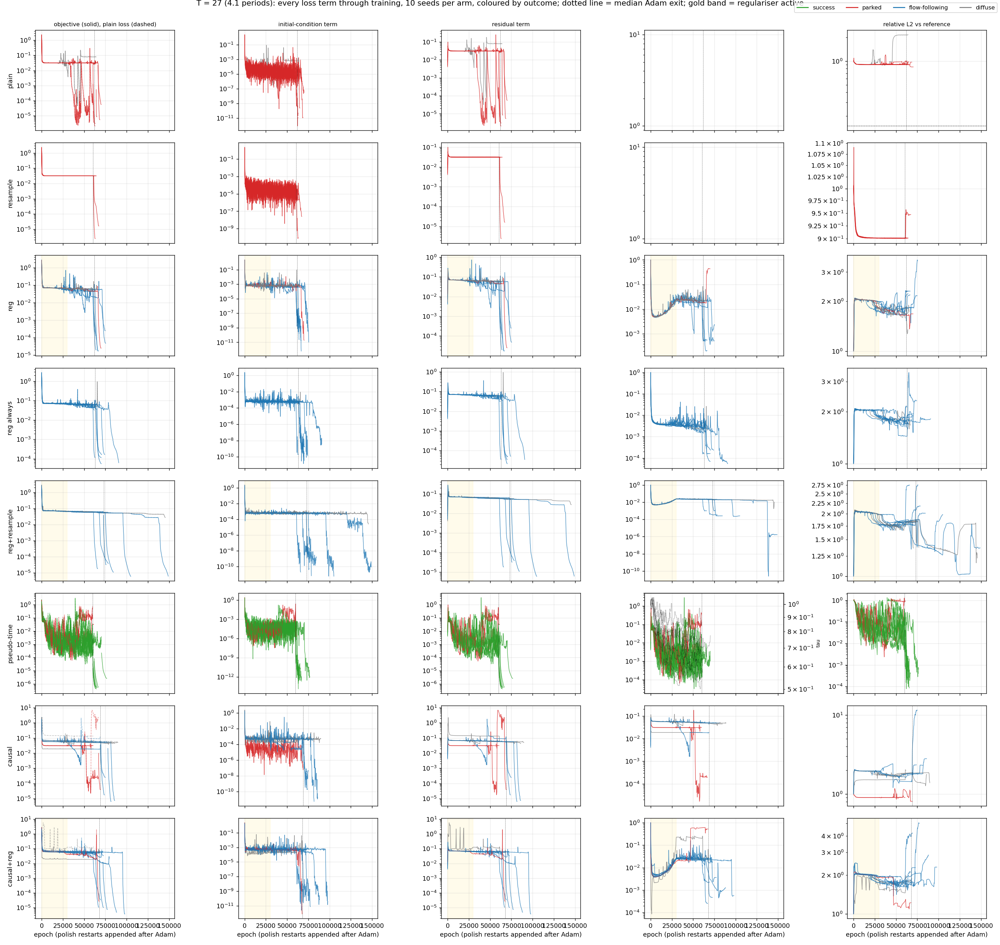

In [5]:
display(Image("figures/c01_convergence_T27.png", width=1400))

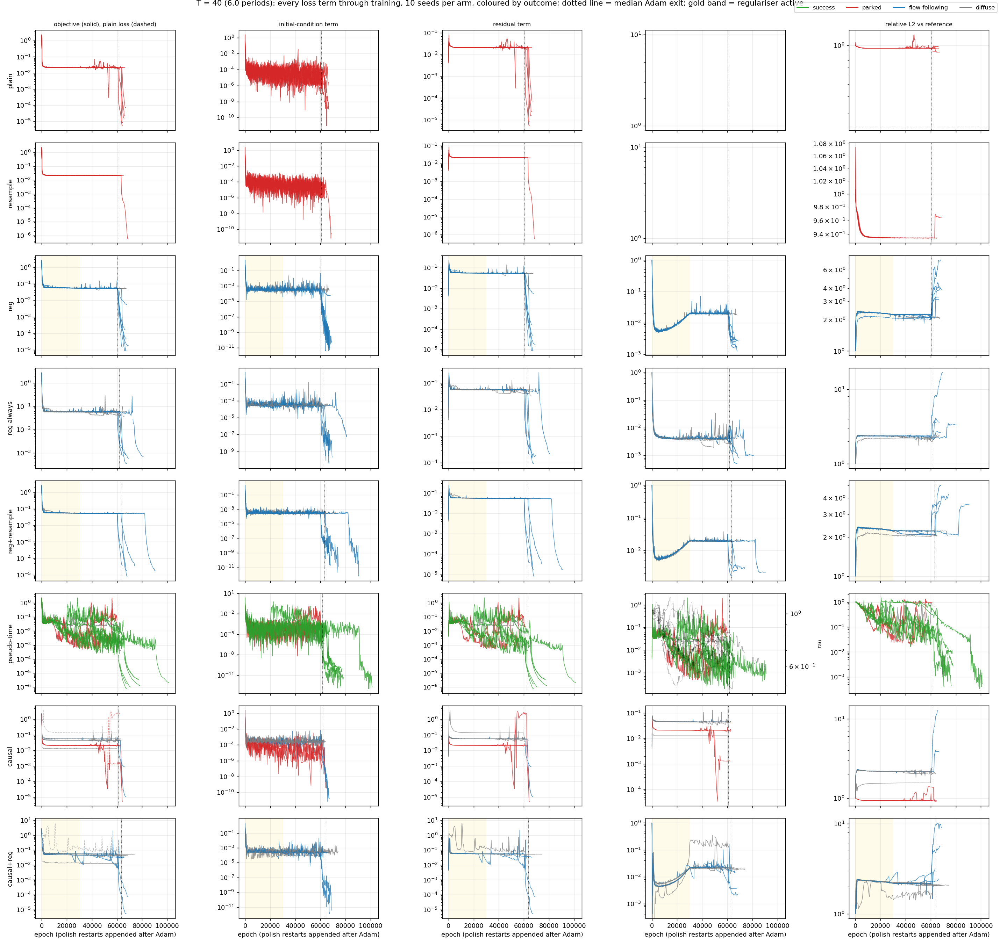

In [6]:
display(Image("figures/c01_convergence_T40.png", width=1400))

## 4. Trajectories and phase portraits

Both state components against the reference (bold = median-error seed), and the phase plane with the median-error seed coloured by time. The regularised failures leave (2, 0) at once and rejoin the loop along a trajectory of the flow from outside; the parked failures spiral into the origin; the pseudo-time successes sit on the loop for the whole window.

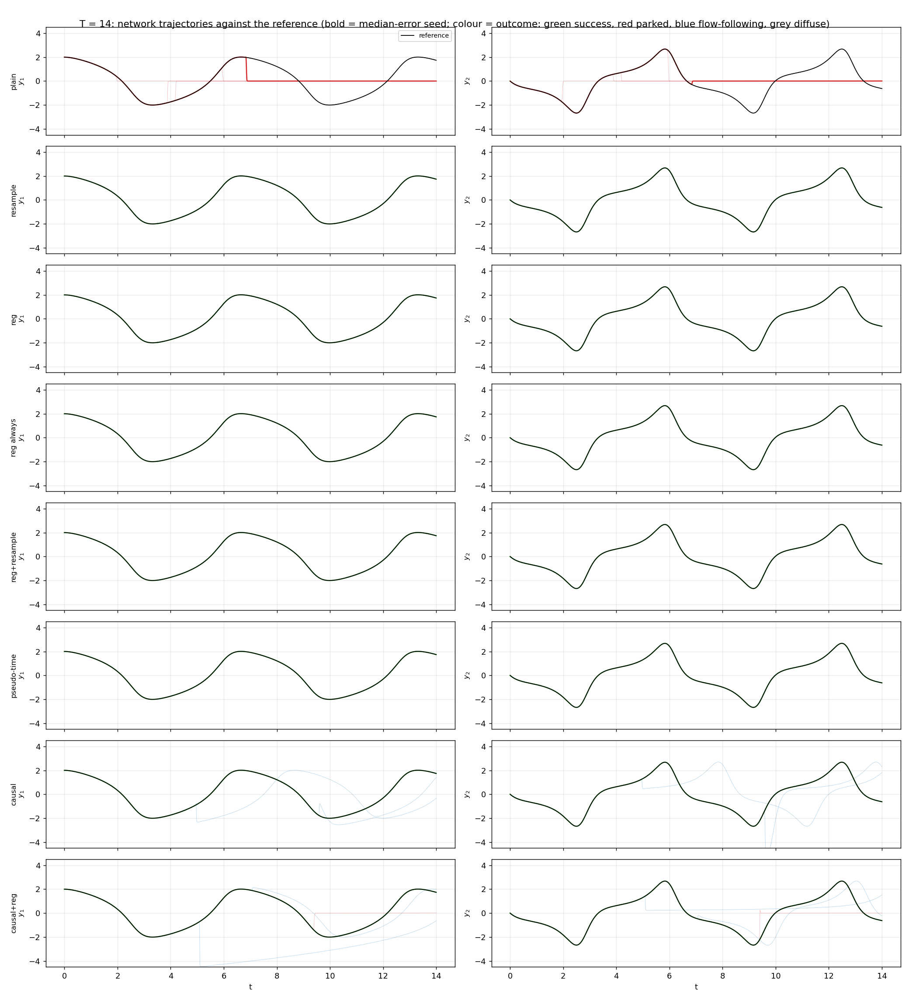

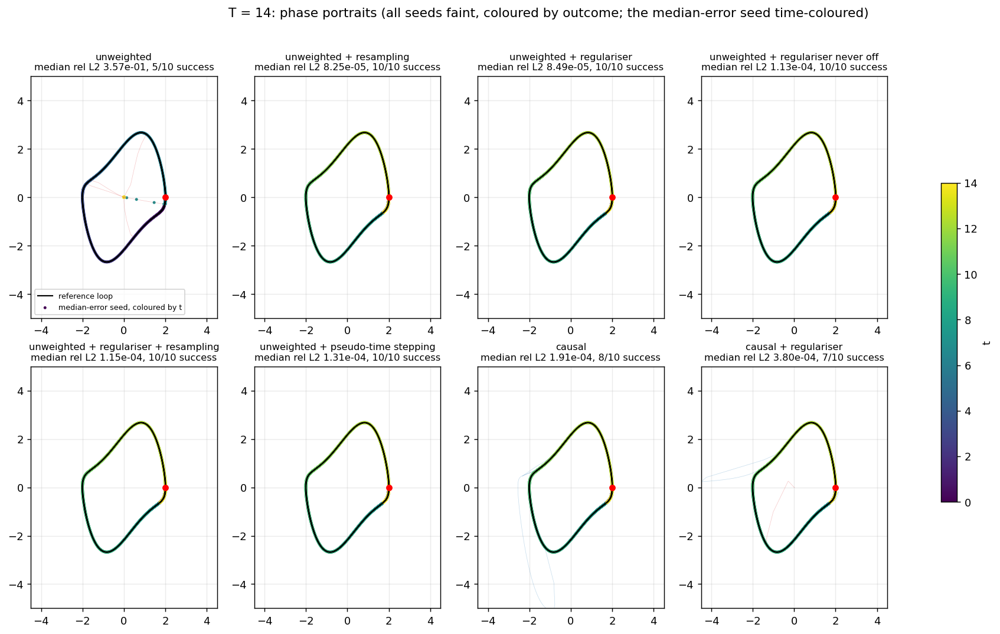

In [7]:
display(Image("figures/c02_trajectories_T14.png", width=1300)); display(Image("figures/c03_phase_portraits_T14.png", width=1300))

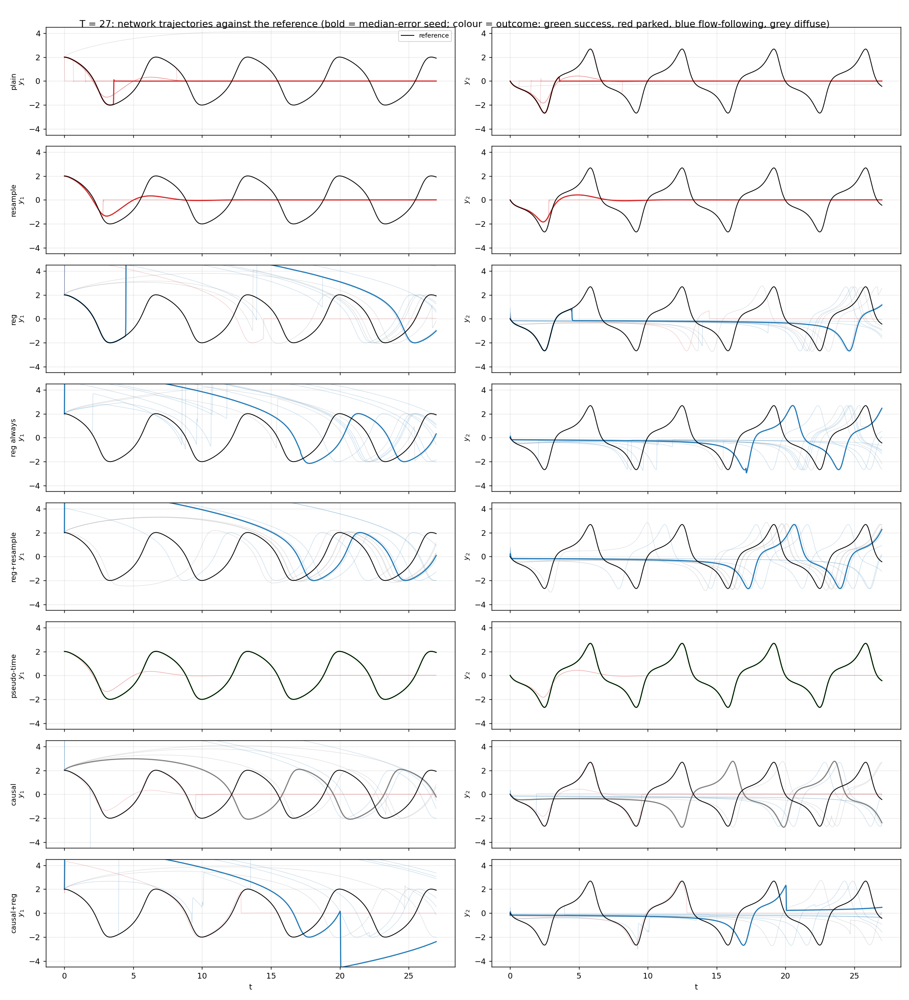

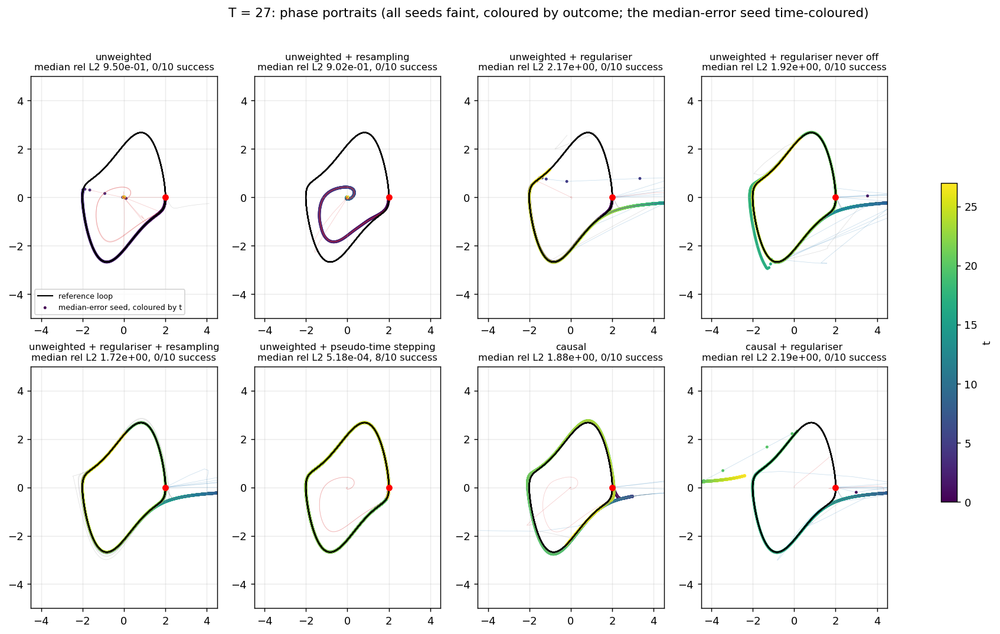

In [8]:
display(Image("figures/c02_trajectories_T27.png", width=1300)); display(Image("figures/c03_phase_portraits_T27.png", width=1300))

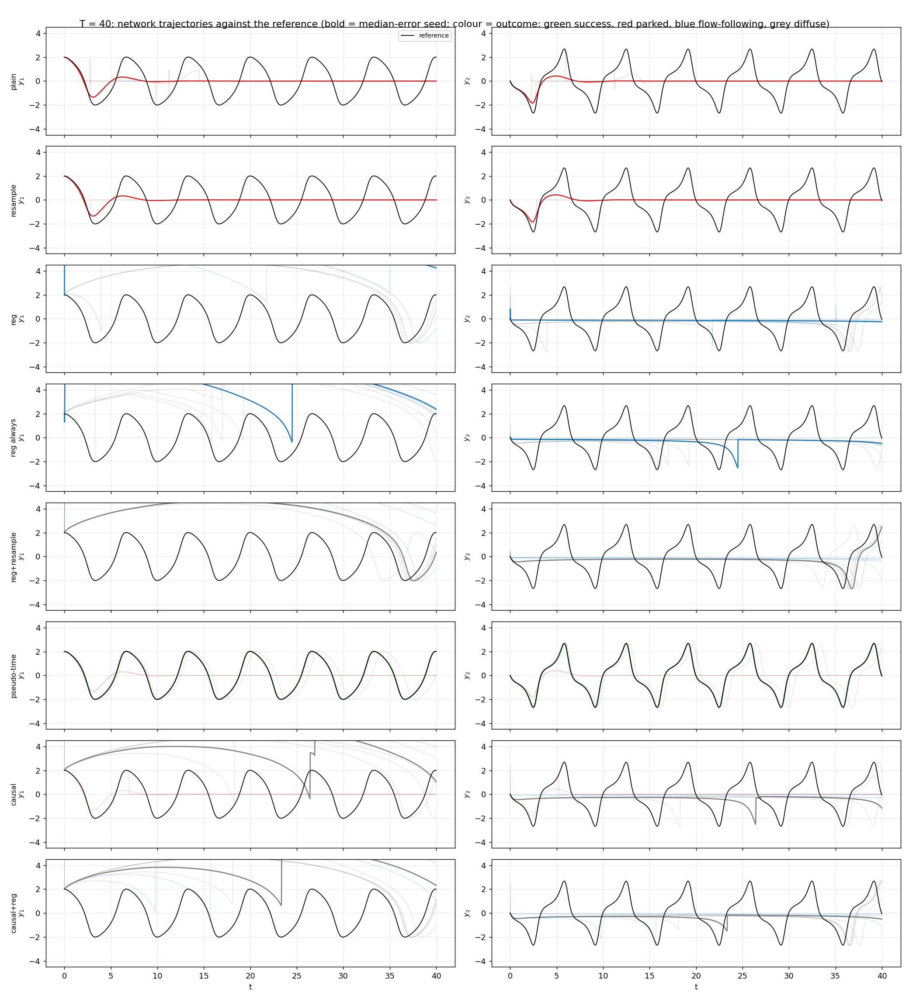

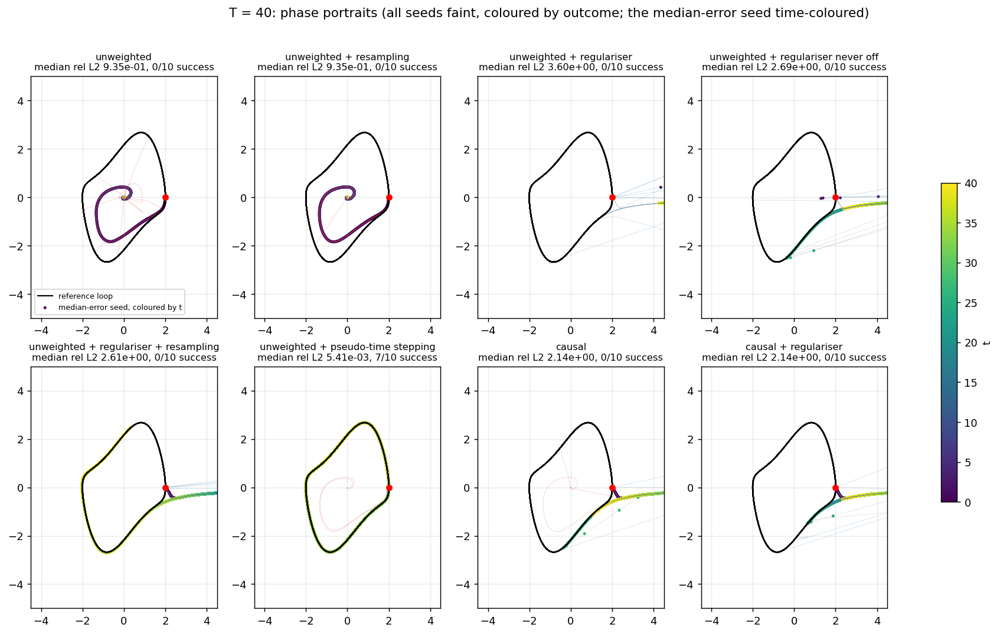

In [9]:
display(Image("figures/c02_trajectories_T40.png", width=1300)); display(Image("figures/c03_phase_portraits_T40.png", width=1300))

## 5. How the phase-space error grows over time

Left: the project's capped pointwise relative error ρ(t). Middle: the phase-space distance |y − y_ref|. Right: the relative L2 accumulated over [0, t], with the 0.15 line. Dotted verticals mark periods. The table gives the median time, in periods, at which ρ first exceeds 1e-2 and at which the accumulated relative L2 first exceeds 0.15 (NaN = never).

In [10]:
ct = summary.pivot(index="arm", columns="horizon", values=["t_rho_1e2_median_periods", "t_l2_015_median_periods"])
ct.index = [SHORT[a] for a in ct.index]
display(ct.round(3))

t_rho_1e2_median_periods               t_l2_015_median_periods              
horizon                          14.0   27.0   40.0                    14.0   27.0   40.0
plain                           0.627  0.214  0.281                   0.648  0.347  0.366
resample                          NaN  0.212  0.212                     NaN  0.362  0.362
reg                               NaN  0.002  0.002                     NaN  0.002  0.002
reg always                        NaN  0.014  0.026                     NaN  0.038  0.073
reg+resample                      NaN  0.002  0.013                     NaN  0.002  0.037
pseudo-time                       NaN  0.213  0.218                     NaN  0.361  0.360
causal                          1.093  0.026  0.028                   1.108  0.072  0.073
causal+reg                      1.063  0.002  0.026                   1.322  0.005  0.071

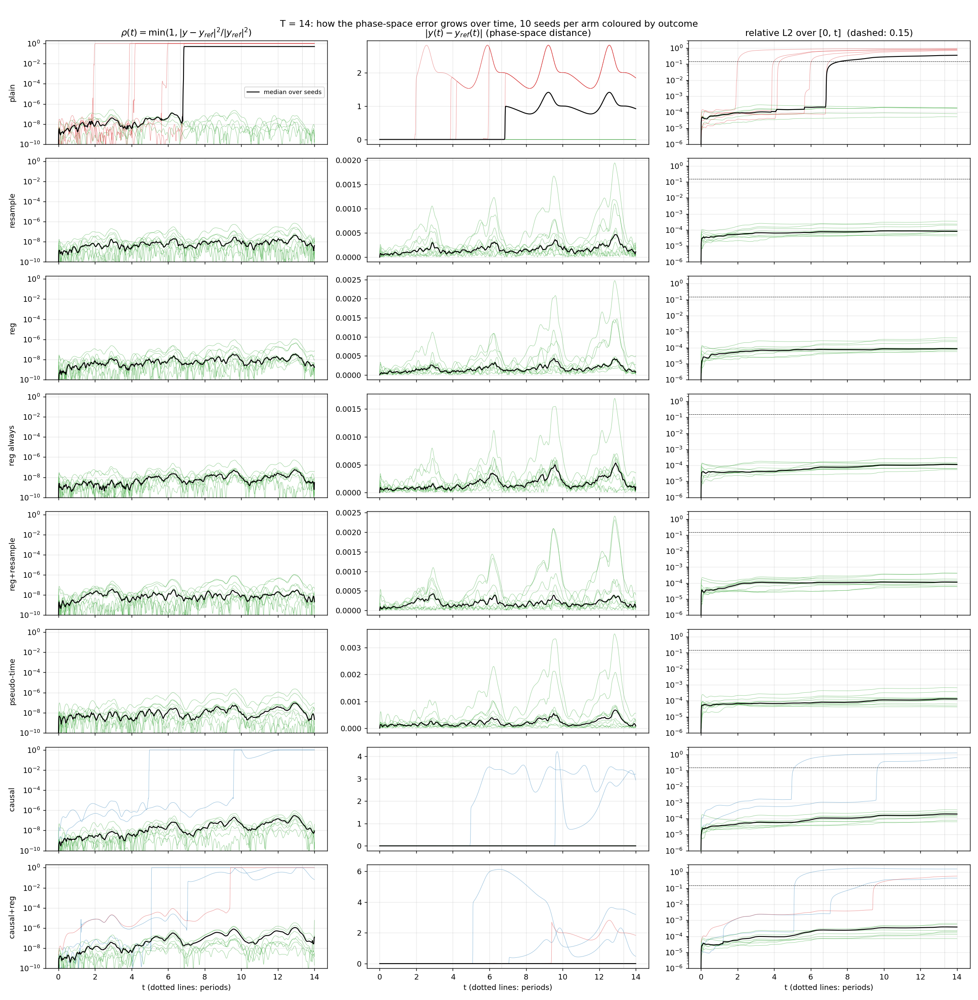

In [11]:
display(Image("figures/c04_error_growth_T14.png", width=1400))

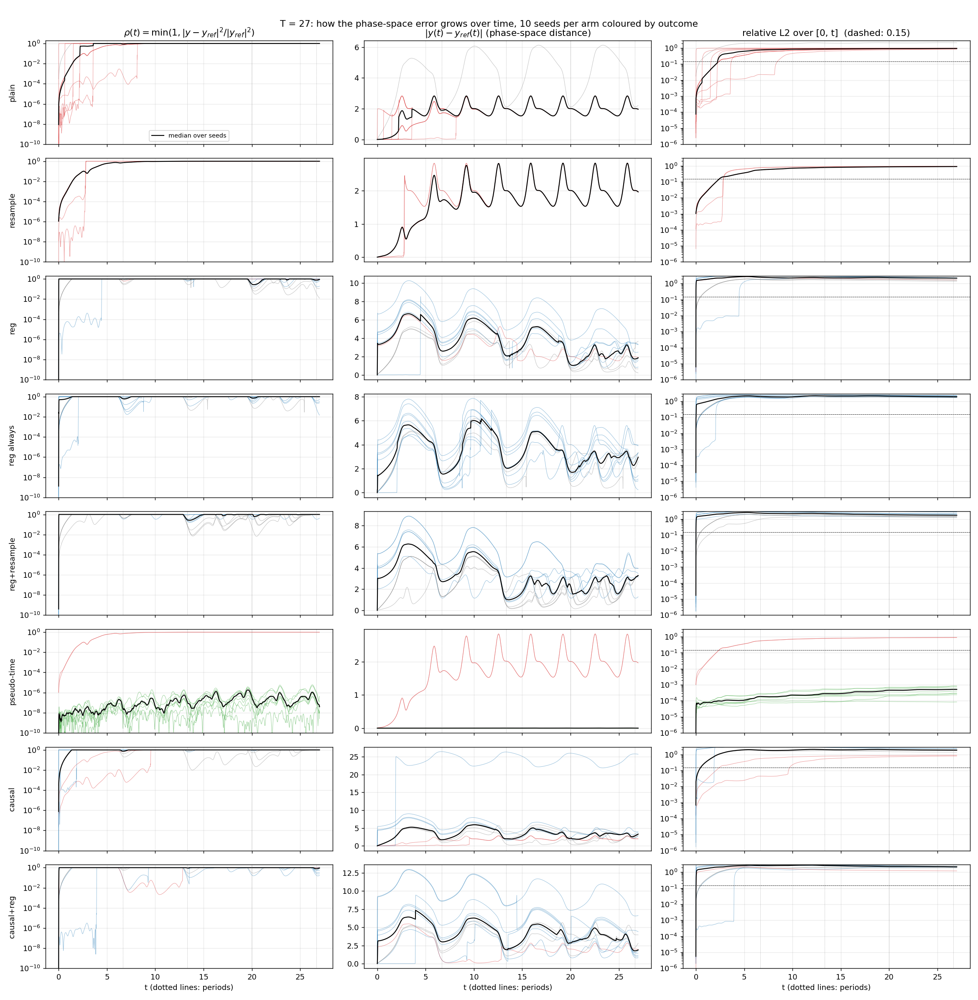

In [12]:
display(Image("figures/c04_error_growth_T27.png", width=1400))

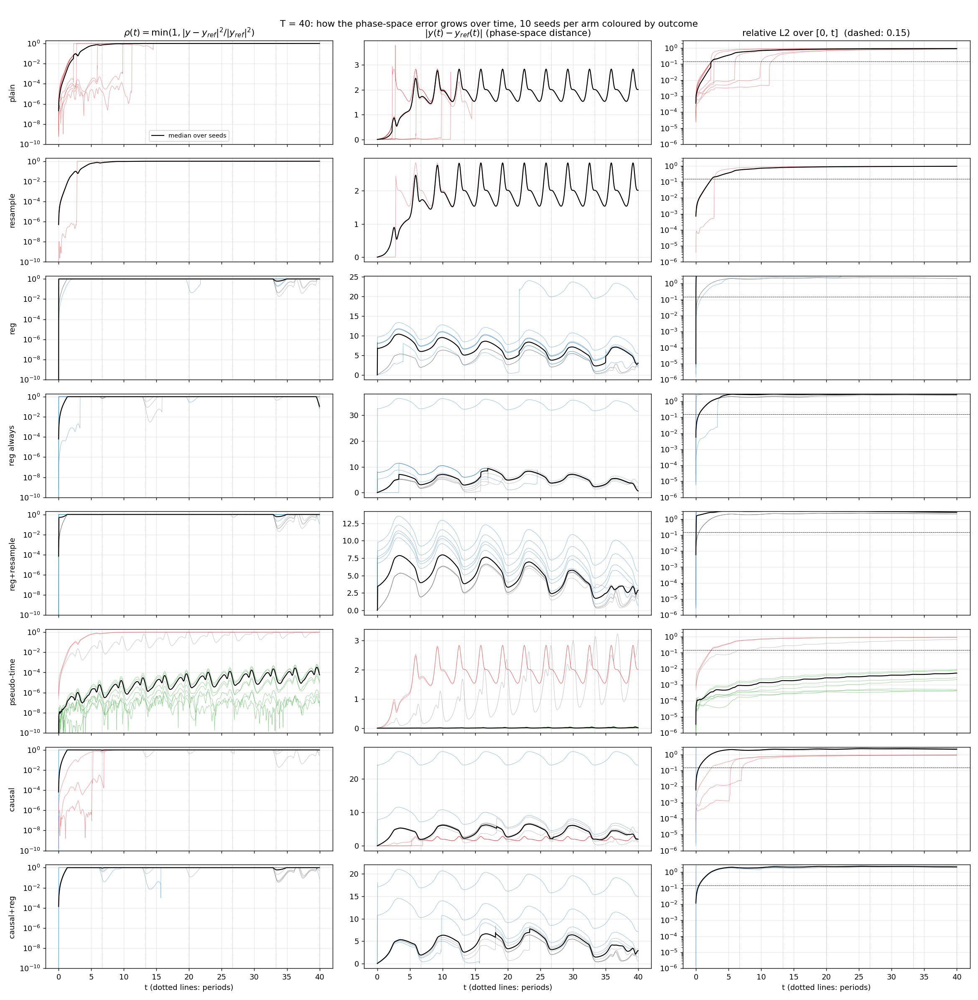

In [13]:
display(Image("figures/c04_error_growth_T40.png", width=1400))

## 6. Failure anatomy: the residual on the reference grid

|r(t)| of the trained network, computed by automatic differentiation on the 0.01 grid. Narrow bands of |r| in the hundreds between long quiet stretches are the splice signature: the network follows one trajectory of the flow, hands over inside a band the collocation set does not resolve, and follows another. The regularised arms splice immediately after the anchor. The classifier's two axes and the class counts follow.

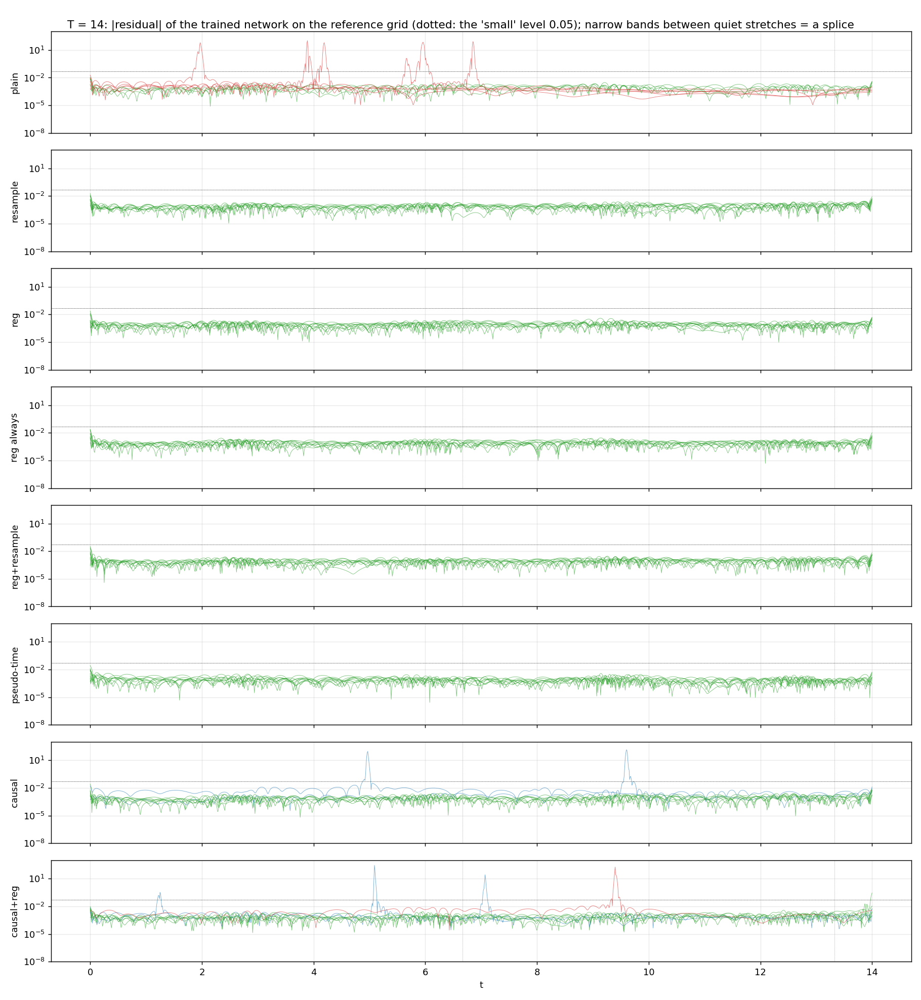

In [14]:
display(Image("figures/c05_residual_profiles_T14.png", width=1300))

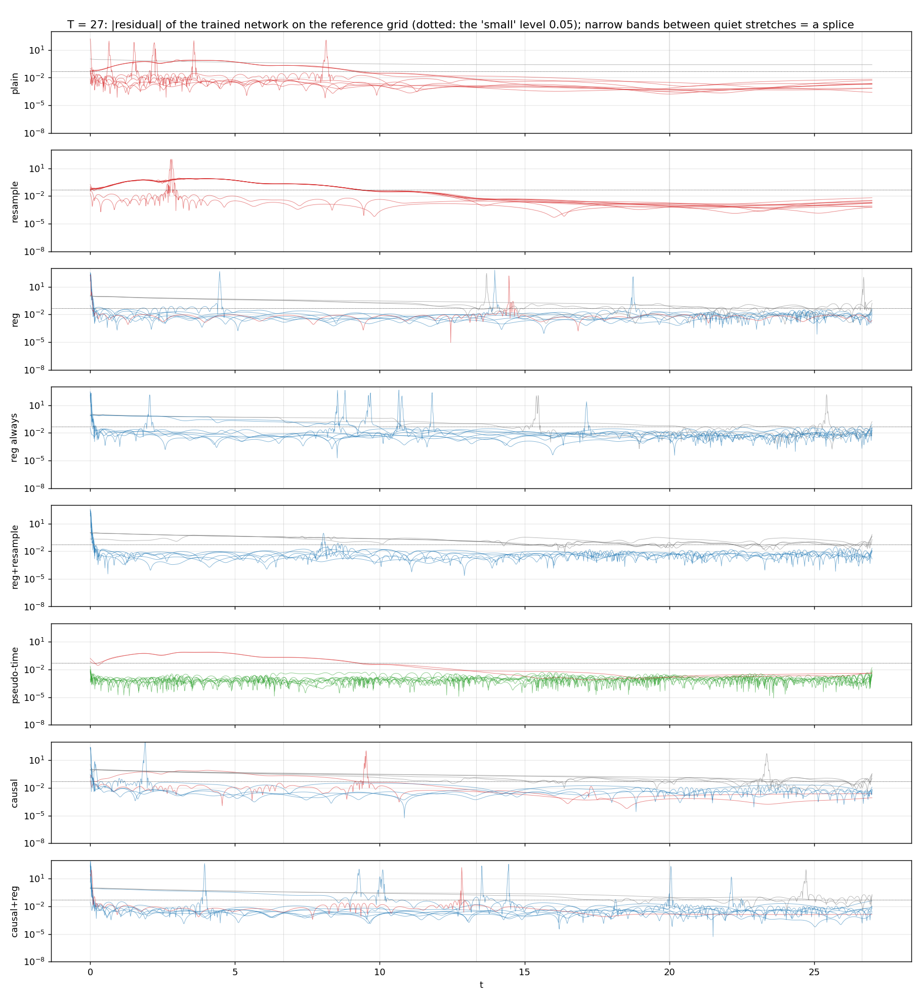

In [15]:
display(Image("figures/c05_residual_profiles_T27.png", width=1300))

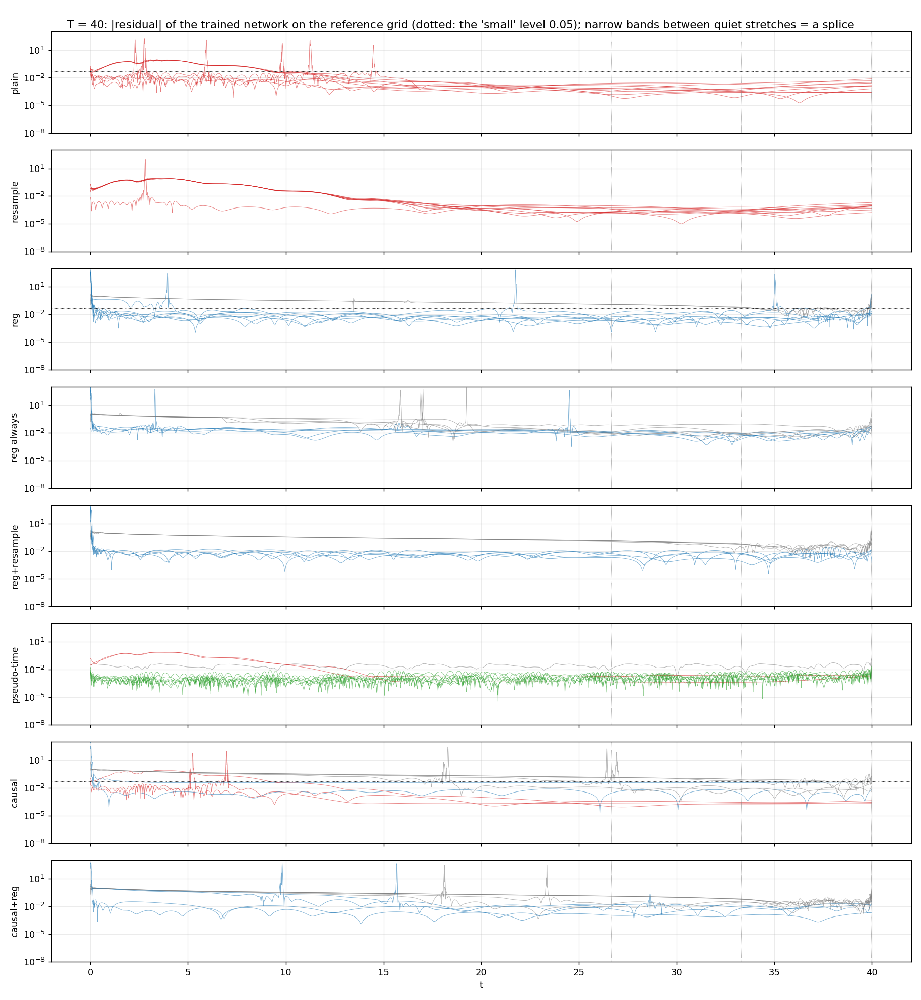

In [16]:
display(Image("figures/c05_residual_profiles_T40.png", width=1300))

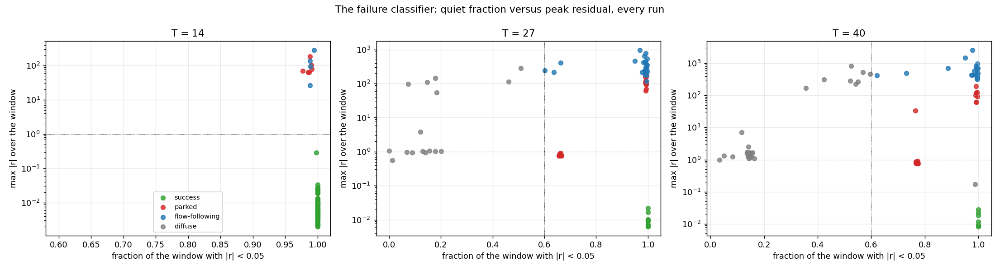

success           parked             flow_following           diffuse          
horizon         14.0 27.0 40.0   14.0  27.0  40.0           14.0 27.0 40.0    14.0 27.0 40.0
plain            5.0  0.0  0.0    5.0   9.0  10.0            0.0  0.0  0.0     0.0  1.0  0.0
resample        10.0  0.0  0.0    0.0  10.0  10.0            0.0  0.0  0.0     0.0  0.0  0.0
reg             10.0  0.0  0.0    0.0   1.0   0.0            0.0  6.0  7.0     0.0  3.0  3.0
reg always      10.0  0.0  0.0    0.0   0.0   0.0            0.0  8.0  5.0     0.0  2.0  5.0
reg+resample    10.0  0.0  0.0    0.0   0.0   0.0            0.0  6.0  5.0     0.0  4.0  5.0
pseudo-time     10.0  8.0  7.0    0.0   2.0   2.0            0.0  0.0  0.0     0.0  0.0  1.0
causal           8.0  0.0  0.0    0.0   2.0   3.0            2.0  4.0  2.0     0.0  4.0  5.0
causal+reg       7.0  0.0  0.0    1.0   1.0   0.0            2.0  7.0  4.0     0.0  2.0  6.0

In [17]:
display(Image("figures/c06_failure_classes.png", width=1300))
cl = summary.pivot(index="arm", columns="horizon", values=["success", "parked", "flow_following", "diffuse"])
cl.index = [SHORT[a] for a in cl.index]
display(cl)

## 7. Before and after: fixed budget, loose plateau, converged

Phase 1 (cluster 5715089) trained every arm for a fixed 60k Adam epochs and 6 polish restarts; the first wave here stopped Adam on a 1e-3 plateau near the 30k floor; the converged set is the extension to the strict rule. Success rates and median losses per protocol.

In [18]:
ba = before_after.pivot_table(index=["arm", "horizon"], columns="protocol", values=["success", "loss_median", "rel_l2_median"], observed=True)
ba = ba.reindex(columns=["phase1_fixed_budget", "wave1_loose_plateau", "converged"], level=1)
ba.index = pd.MultiIndex.from_tuples([(SHORT[a], T) for a, T in ba.index])
display(ba.round(5))

loss_median                                     rel_l2_median                                           success                              
protocol          phase1_fixed_budget wave1_loose_plateau converged phase1_fixed_budget wave1_loose_plateau converged phase1_fixed_budget wave1_loose_plateau converged
plain        14.0             0.00000             0.00000   0.00000             0.35679             0.37058   0.35672                 5.0                 5.0       5.0
             27.0             0.00382             0.01563   0.00003             0.92267             0.90160   0.94967                 0.0                 0.0       0.0
             40.0             0.01120             0.02102   0.01052             0.93512             0.93536   0.93506                 0.0                 0.0       0.0
resample     14.0             0.00000             0.00000   0.00000             0.00015             0.00012   0.00008                10.0                10.0      10.0
             27.0             0.03123             0.03125   0.03123             0.90187             0.90179   0.90215                 0.0                 0.0       0.0
             40.0             0.02111             0.02110   0.02111             0.93475             0.93493   0.93476                 0.0                 0.0       0.0
reg          14.0             0.00000             0.00000   0.00000             0.00008             0.00013   0.00008                10.0                10.0      10.0
             27.0             0.00134             0.00010   0.00009             2.19706             2.60308   2.17207                 0.0                 0.0       0.0
             40.0             0.00684             0.00022   0.00011             3.07806             3.43465   3.60226                 0.0                 0.0       0.0
reg always   14.0                 NaN             0.00000   0.00000                 NaN             0.00010   0.00011                 NaN                10.0      10.0
             27.0                 NaN             0.04519   0.00017                 NaN             1.92013   1.92034                 NaN                 0.0       0.0
             40.0                 NaN             0.04003   0.01832                 NaN             2.44780   2.69461                 NaN                 0.0       0.0
reg+resample 14.0                 NaN                 NaN   0.00000                 NaN                 NaN   0.00012                 NaN                 NaN      10.0
             27.0                 NaN                 NaN   0.00004                 NaN                 NaN   1.71510                 NaN                 NaN       0.0
             40.0                 NaN                 NaN   0.02540                 NaN                 NaN   2.60883                 NaN                 NaN       0.0
pseudo-time  14.0                 NaN                 NaN   0.00000                 NaN                 NaN   0.00013                 NaN                 NaN      10.0
             27.0                 NaN                 NaN   0.00000                 NaN                 NaN   0.00052                 NaN                 NaN       8.0
             40.0                 NaN                 NaN   0.00000                 NaN                 NaN   0.00541                 NaN                 NaN       7.0
causal       14.0             0.00000             0.00000   0.00000             0.00019             0.00018   0.00019                 8.0                 8.0       8.0
             27.0             0.00418             0.00650   0.01576             1.94566             1.89698   1.87767                 0.0                 0.0       0.0
             40.0             0.00328             0.02060   0.02897             2.17664             2.18518   2.13871                 0.0                 0.0       0.0
causal+reg   14.0             0.00000             0.00000   0.00000             0.00061             0.00018   0.00038                 7.0                 7.0     

## 8. Every run

One row per run with its convergence record, metrics, failure class and crossing times (`results/converged_runs.csv`). Regenerate everything with `python analysis_converged.py`.

In [19]:
runs[["tag", "adam_epochs", "adam_exit", "lbfgs_restarts", "lbfgs_exit", "converged", "loss_total", "rel_l2", "frac_near_origin", "max_modulus", "failure_class", "residual_small_fraction", "residual_peak", "t_rho_above_1e-2", "t_relL2_above_0.15"]].sort_values("tag").reset_index(drop=True)

,tag,adam_epochs,adam_exit,lbfgs_restarts,lbfgs_exit,converged,loss_total,rel_l2,frac_near_origin,max_modulus,failure_class,residual_small_fraction,residual_peak,t_rho_above_1e-2,t_relL2_above_0.15
0,base_causal_T14_s0,74250,plateau,6,stalled,True,5.395302e-07,0.000353,0.000000,2.829961,success,1.000000,0.004031,NaN,NaN
1,base_causal_T14_s1,60000,plateau,11,stalled,True,2.321226e-07,0.000266,0.000000,2.830029,success,1.000000,0.008641,NaN,NaN
2,base_causal_T14_s2,60250,plateau,14,stalled,True,1.027008e-06,0.645060,0.000000,5.175491,flow-following,0.988580,136.635022,9.59,9.66
3,base_causal_T14_s3,60750,plateau,20,stalled,True,1.988041e-05,1.263345,0.000000,2.844754,flow-following,0.989293,93.869508,4.97,5.11
4,base_causal_T14_s4,62000,plateau,12,stalled,True,3.370731e-07,0.000124,0.000000,2.829948,success,1.000000,0.005165,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
235,resample_unw_T40_s5,62750,plateau,3,stalled,True,2.118477e-02,0.934788,0.816296,1.998528,parked,0.772307,0.762865,1.41,2.41
236,resample_unw_T40_s6,60000,plateau,3,stalled,True,2.111033e-02,0.935079,0.816546,1.998416,parked,0.767058,0.788550,1.40,2.41
237,resample_unw_T40_s7,61000,plateau,3,stalled,True,2.110816e-02,0.934869,0.816796,1.998488,parked,0.770057,0.780933,1.41,2.41
238,resample_unw_T40_s8,60000,plateau,3,stalled,True,2.107875e-02,0.934727,0.816296,1.998649,parked,0.768808,0.780356,1.44,2.41
